### Experiment Summary (13.08 16:00)

- *Normalization*: Z-score normalization performed per bin
- *Devices*: 18
- *Workers*: 12
- *Participants*: 24 (each participant is assigned to 2 workers with RR policy)
- *Epochs*: 9 epochs for each source
- *CNN Activation Function*: ELU
- *Fully Connected Layers*: 256, 128, 64, 32, 16, 9
- *Activation Function (before the last layer)*: Tanh
- *Last Layer Type*: Probabilistic with softmax function
- *Loss Method*: Cross-Entropy (CE)
- *Learning Rate*: 0.00001
- *Regularization*: L2 applied
- *Optimizer*: SGD

*Training Phases*:
- *Phases 1-2*: Participants 1-6
- *Phases 3-4*: Participants 7-12
- *Phases 5-6*: Participants 13-18
- *Phases 7-8*: Participants 19-24

*Prediction Phase*: 1


In [1]:
import set_jupyter_env
from apiServer import *
import pandas as pd 

In [2]:
API = ApiServer()

In [3]:
API.showJsons()


Distributed Configuration Files
--------------------

0.	dc_10w_14d_8r_3s_10c_synt.json
1.	dc_12w_12c_13d_4s_4r_tiles_rr.json
2.	dc_5d_4c_4s_4r_12w.json
3.	dc_AEC_1d_2c_1s_4r_4w.json
4.	dc_EEG_18d_12c_6s_10r_12w_CE.json
5.	dc_EEG_18d_12c_6s_10r_12w_MSE.json
6.	dc_EEG_18d_9c_3s_5r_9w_RR.json
7.	dc_EEG_1d_1c_3s_2r_3w_RR.json
8.	dc_EEG_1d_2c_1s_4r_2w.json
9.	dc_EEG_1d_2c_1s_4r_4w.json
10.	dc_EEG_3d_1c_1s_1r_1w.json
11.	dc_EEG_4d_3c_3s_2r_3w.json
12.	dc_EEG_8d_1c_3s_2r_3w_RR.json
13.	dc_EEG_8d_3c_3s_2r_3w.json
14.	dc_EEG_8d_3c_3s_2r_3w_RR.json
15.	dc_EEG_8d_3c_3s_2r_3w_demo_RR.json
16.	dc_EEG_8d_3c_3s_5r_3w_RR.json
17.	dc_EEG_8d_8c_3s_5r_8w_RR.json
18.	dc_FedTorchTest_5d_2s_2r_4c_4w.json
19.	dc_dist_14d.json
20.	dc_dist_2d_3c_2s_3r_6w.json
21.	dc_fed_dist_14d.json
22.	dc_fed_dist_2d_3c_2s_3r_6w.json
23.	dc_fed_synt_1d_2c_2r_1s_4w_1ws.json
24.	dc_mnist_13d_12w_4r_3s_3tokens.json
25.	dc_mnist_4w_5d_4r_4s_rr.json
26.	dc_synt_8d_8w_2c_4s_4r.json
27.	dc_synt_8d_8w_4c_6r_4s.json
28.	dc_synt_dis

In [4]:
dc = 4
conn = 31
exp = 22
API.setJsons(dc , conn , exp)

In [5]:
dc_path , conn_path , exp_path = API.getUserJsons()

In [6]:
exp_name = "EEG_Emotion_18Devices_24Persons_RR"
API.initialization(exp_name, dc_path, conn_path, exp_path)

[INFO][2024-08-13 10:19:21,550] 
Network components:
                 Receiver's Address: http://10.0.0.30:8931
                 Frequency: 5 [batches/sec]
                 Batchsize: 10 [samples]
                 devicesIp: ['10.0.0.30', '10.0.0.8', '10.0.0.12', '10.0.0.10', '10.0.0.32', '10.0.0.33', '10.0.0.34', '10.0.0.35', '10.0.0.47', '10.0.0.48', '10.0.0.49', '10.0.0.50', '10.0.0.51', '10.0.0.52', '10.0.0.53', '10.0.0.54', '10.0.0.55', '10.0.0.56']
                 mainServerIp: 10.0.0.30
                 mainServerPort: 8900
                 apiServerIp: 10.0.0.30
                 apiServerPort: 8931
                 Clients: ['c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9', 'c10', 'c11', 'c12']
                 Workers: ['w1', 'w2', 'w3', 'w4', 'w5', 'w6', 'w7', 'w8', 'w9', 'w10', 'w11', 'w12']
                 Sources: ['s1', 's2', 's3', 's4', 's5', 's6']
                 Routers: ['r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9', 'rms']
[INFO][2024-08-13 10:19:21,551

 * Serving Flask app 'receiver'
 * Debug mode: off


[INFO][2024-08-13 10:19:23,820] *** Remember to execute NerlnetRun.sh on each device before running the experiment! ***


Note: you may need to restart the kernel to use updated packages.
Connections:  [('rms', ['mainServer', 'r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9']), ('r1', ['c1', 'c2', 'r2']), ('r2', ['c3', 'c4', 'r3']), ('r3', ['c5', 'c6', 'r4']), ('r4', ['c7', 'c8', 'r5']), ('r5', ['c9', 'c10', 'r6']), ('r6', ['c11', 'c12', 'r7']), ('r7', ['s1', 's2', 'r8', 'r4', 'r2', 'r5', 'r3', 'r1']), ('r8', ['s3', 's4', 'r9', 'r3', 'r4', 'r1', 'r2']), ('r9', ['s5', 's6', 'r3', 'r5', 'r1', 'r6', 'r2', 'r4'])]
Routers:  ['rms', 'r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9']
Workers:  ['w1', 'w2', 'w3', 'w4', 'w5', 'w6', 'w7', 'w8', 'w9', 'w10', 'w11', 'w12']
Adding edge (rms , mainServer) to graph
Adding edge (rms , r1) to graph
Adding edge (rms , r2) to graph
Adding edge (rms , r3) to graph
Adding edge (rms , r4) to graph
Adding edge (rms , r5) to graph
Adding edge (rms , r6) to graph
Adding edge (rms , r7) to graph
Adding edge (rms , r8) to graph
Adding edge (rms , r9) to graph
Adding edge (r1

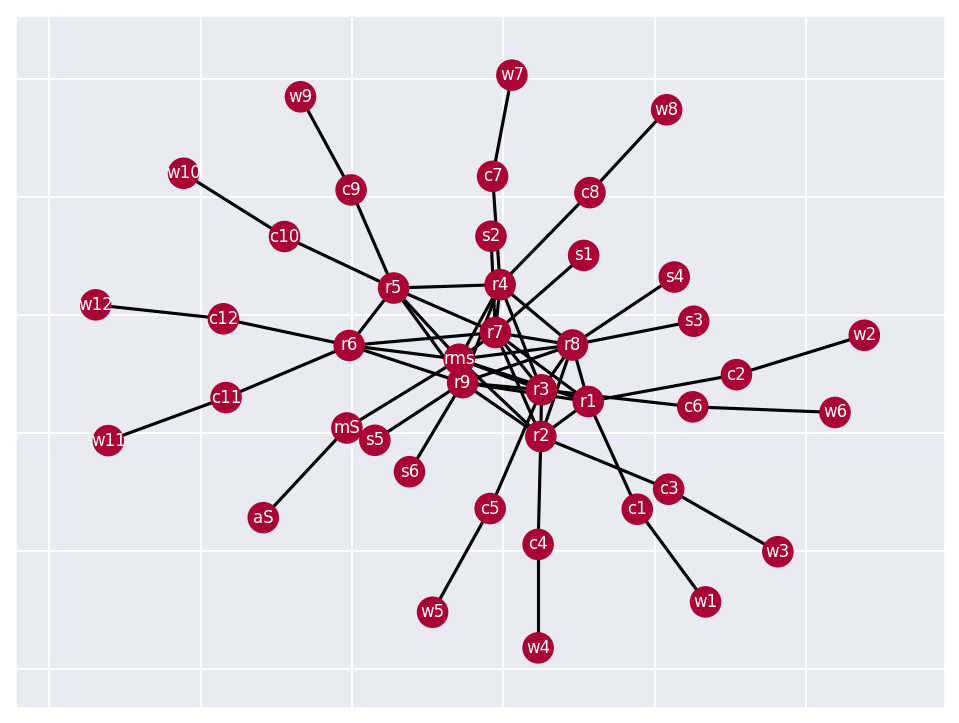

In [7]:
%pip install networkx pygraphviz
import networkx as nx
def visualize_nerlnet_graph(api_server_inst,  connections : dict , components): # connections is a dictionary with keys as routers and values as lists of their neighbors
    print("Connections: " , list(connections.items()))
    routers = list(connections.keys())
    print("Routers: " , routers)
    workers = list(components.map_worker_to_client.keys())
    print("Workers: " , workers)
    graph = nx.Graph()
    nodes = routers + components.sources + components.clients + workers + [API_SERVER_STR , MAIN_SERVER_STR]
    edges = [] # list of tuples
    for router , neighbors in list(connections.items()):
        for neighbor in neighbors:
            if (router,neighbor) not in edges:
                print(f"Adding edge ({router} , {neighbor}) to graph")
                edges.append((router , neighbor))
    edges.append((API_SERVER_STR , MAIN_SERVER_STR)) # Always connected
    for worker in workers:
        edges.append((worker , components.map_worker_to_client[worker]))
    graph.add_nodes_from(nodes)
    graph.add_edges_from(edges)
    
    my_labels = {'mainServer': 'mS' , 'apiServer': 'aS'}
    nx.relabel_nodes(graph, my_labels , copy=False)
    
    default_colors = {node:'#A90433' for node in graph.nodes()}
    node_colors = {node:default_colors[node] for node in graph.nodes()}
    nx.set_node_attributes(graph, node_colors, 'color')
    colors = nx.get_node_attributes(graph, 'color').values()

    pos = nx.nx_agraph.graphviz_layout(graph)
    angle = 100
    
    plt.figure(figsize=(8,6),dpi=150)
    nx.draw_networkx(graph, pos, with_labels=True, node_color=colors , node_size=200, font_size=8, font_color='white' , edge_color='black' , width=1.5)
    plt.show()
visualize_nerlnet_graph(API , API.json_dir_parser.json_from_path(conn_path)['connectionsMap'] , globe.components)

In [8]:
API.send_jsons_to_devices()

[INFO][2024-08-13 10:19:27,160] Sending distributed configurations to devices is completed


In [9]:
API.run_current_experiment_phase()

[INFO][2024-08-13 10:19:27,166] Experiment phase: training_phase1 of type training starts running...
[INFO][2024-08-13 10:19:27,167] Sending data to sources
[INFO][2024-08-13 10:19:49,606] Data is ready in sources
[INFO][2024-08-13 10:19:49,607] Phase training requested from Main Server
[INFO][2024-08-13 10:37:47,548] Processing experiment phase data
[INFO][2024-08-13 10:37:47,985] Processing experiment phase data completed
[INFO][2024-08-13 10:37:47,986] Start generating communication statistics for training_phase1 of type training
[INFO][2024-08-13 10:37:47,986] Statistics requested from Main Server
[INFO][2024-08-13 10:37:48,039] Statistics received from Main Server
[INFO][2024-08-13 10:37:48,040] Phase of training_phase1 training completed


In [10]:
stats_train1 = API.get_experiment_flow(exp_name).generate_stats()

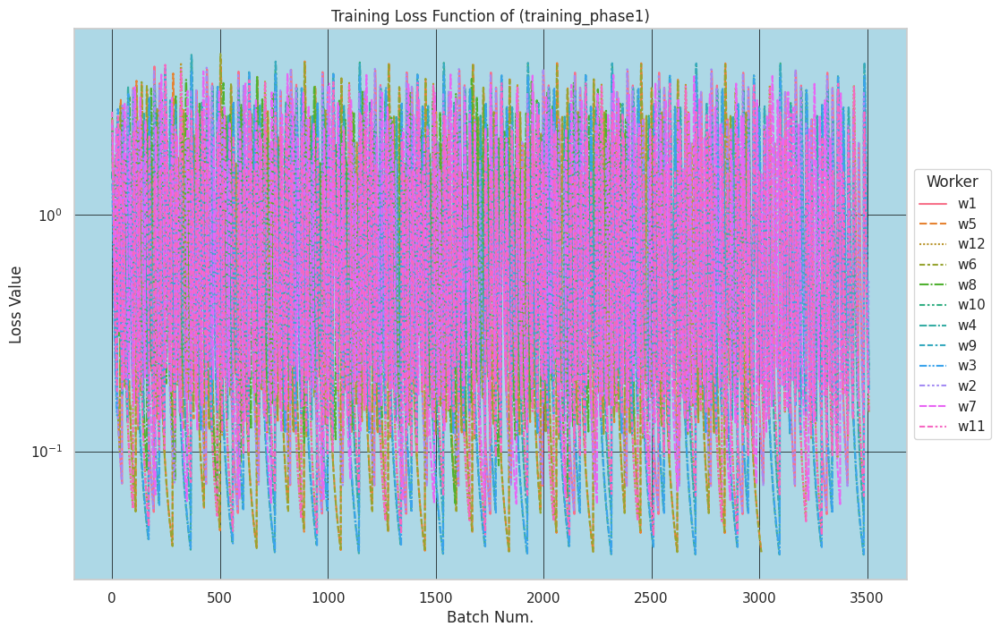

In [11]:
df_loss = stats_train1.get_loss_ts(plot=True, smoothing = True, log_plot = True)

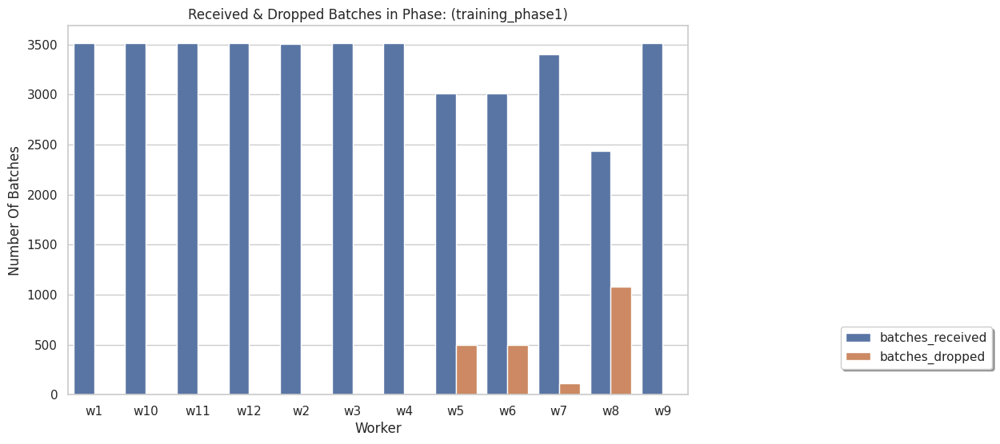

In [12]:
stats_train1.plot_batches_status(plot=True)


In [14]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 10:37:51,516] Experiment phase: training_phase2 of type training starts running...
[INFO][2024-08-13 10:37:51,517] Sending data to sources
[INFO][2024-08-13 10:38:13,741] Data is ready in sources
[INFO][2024-08-13 10:38:13,742] Phase training requested from Main Server
[INFO][2024-08-13 10:56:11,766] Processing experiment phase data
[INFO][2024-08-13 10:56:12,078] Processing experiment phase data completed
[INFO][2024-08-13 10:56:12,079] Start generating communication statistics for training_phase2 of type training
[INFO][2024-08-13 10:56:12,079] Statistics requested from Main Server
[INFO][2024-08-13 10:56:12,132] Statistics received from Main Server
[INFO][2024-08-13 10:56:12,134] Phase of training_phase2 training completed


In [15]:
stats_train2 = API.get_experiment_flow(exp_name).generate_stats()

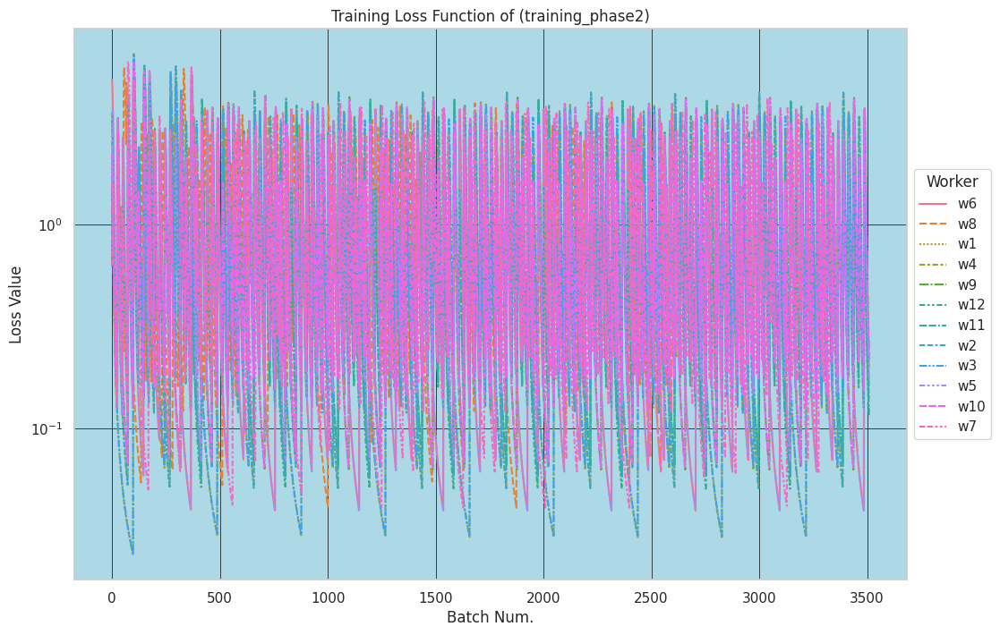

,w6,w8,w1,w4,w9,w12,w11,w2,w3,w5,w10,w7
0,5.142295,1.550192,3.337227,2.230973,0.652198,3.572361,0.871542,3.264247,0.625263,1.110323,2.242817,0.635064
1,4.821064,1.389131,3.071774,1.995589,1.427376,3.292859,2.180535,3.000527,1.404513,3.062836,2.014050,1.447148
2,4.348081,1.183953,2.697636,1.683819,1.588772,2.895350,2.557363,2.629824,1.562113,3.719240,1.710256,1.615959
3,3.812352,0.987247,2.297971,1.376587,1.483051,2.466259,2.490755,2.235305,1.450669,3.737151,1.409195,1.504124
4,3.264249,0.818407,1.917699,1.109730,1.284012,2.053667,2.230863,1.861672,1.247327,3.449951,1.145514,1.294710
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.223715,NaN,0.177178,0.279168,0.355379,0.147960,0.157366,0.175694,0.303031,0.240969,0.324604,NaN
3506,0.204984,NaN,0.165648,0.254726,0.319022,0.138476,0.146686,0.164322,0.274889,0.219506,0.293365,NaN
3507,0.189037,NaN,0.155484,0.233906,0.288673,0.130124,0.137348,0.154292,0.251112,0.201401,0.267067,NaN
3508,0.175314,NaN,0.146462,0.216006,0.263085,0.122715,0.129116,0.145383,0.230826,0.185953,0.244713,NaN


In [16]:
stats_train2.get_loss_ts(plot=True, smoothing = True, log_plot = True)

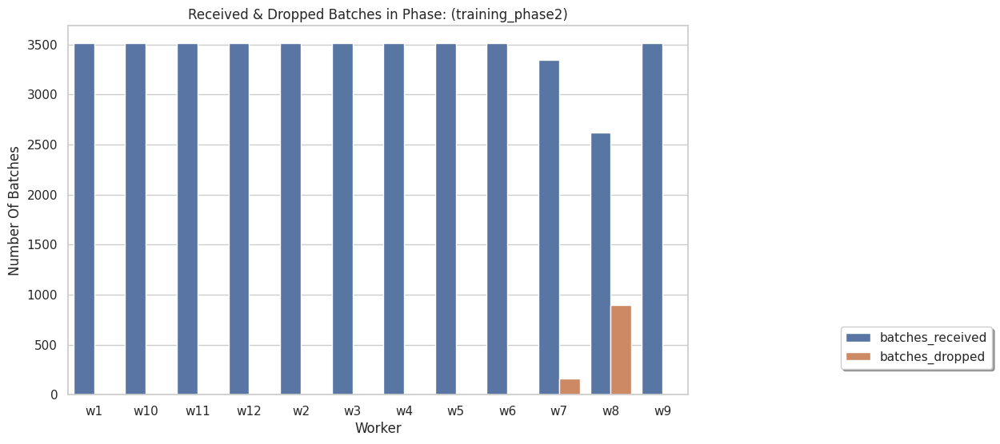

In [17]:
stats_train2.plot_batches_status(plot=True)

In [18]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 10:56:15,500] Experiment phase: training_phase3 of type training starts running...
[INFO][2024-08-13 10:56:15,501] Sending data to sources
[INFO][2024-08-13 10:56:39,056] Data is ready in sources
[INFO][2024-08-13 10:56:39,057] Phase training requested from Main Server
[INFO][2024-08-13 11:14:36,668] Processing experiment phase data
[INFO][2024-08-13 11:14:36,992] Processing experiment phase data completed
[INFO][2024-08-13 11:14:36,993] Start generating communication statistics for training_phase3 of type training
[INFO][2024-08-13 11:14:36,993] Statistics requested from Main Server
[INFO][2024-08-13 11:14:37,046] Statistics received from Main Server
[INFO][2024-08-13 11:14:37,047] Phase of training_phase3 training completed


In [19]:
stats_train3 = API.get_experiment_flow(exp_name).generate_stats()

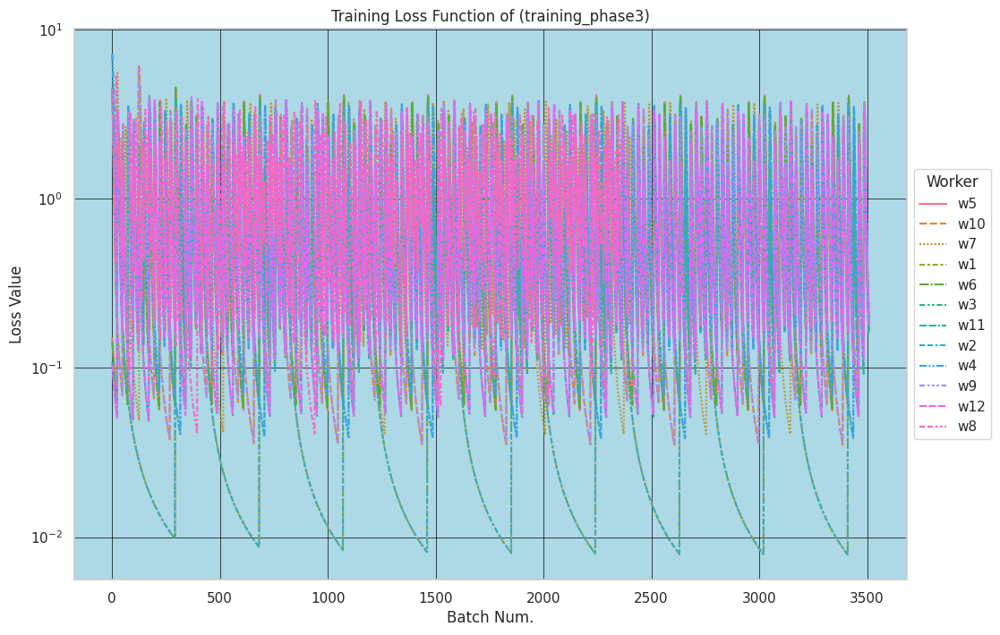

,w5,w10,w7,w1,w6,w3,w11,w2,w4,w9,w12,w8
0,0.149456,4.017968,4.417970,4.267745,0.142509,7.086614,0.108749,4.537752,7.162631,3.974680,0.104213,4.437395
1,0.145081,3.750545,4.149389,4.144148,0.138512,6.808528,0.106146,4.248473,6.882149,3.710223,0.101819,4.166230
2,0.138989,3.367083,3.761608,3.805737,0.132929,6.402347,0.102476,3.827325,6.472375,3.331250,0.098436,3.774686
3,0.132437,2.946044,3.331140,3.377920,0.126906,5.942896,0.098480,3.366966,6.008836,2.915369,0.094741,3.340124
4,0.125998,2.529460,2.898350,2.927055,0.120969,5.467112,0.094499,2.902322,5.528881,2.504068,0.091053,2.903448
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.226405,0.298773,NaN,0.187664,0.226017,0.263877,0.248104,0.204268,0.263582,0.298933,0.247655,NaN
3506,0.208373,0.270137,NaN,0.173270,0.208001,0.240232,0.226191,0.187481,0.239957,0.270296,0.225767,NaN
3507,0.192841,0.246064,NaN,0.160822,0.192486,0.220194,0.207597,0.173101,0.219938,0.246219,0.207198,NaN
3508,0.179346,0.225618,NaN,NaN,0.179009,0.203042,0.191659,0.160666,0.202804,0.225766,0.191284,NaN


In [20]:
stats_train3.get_loss_ts(plot=True, smoothing = True, log_plot = True)

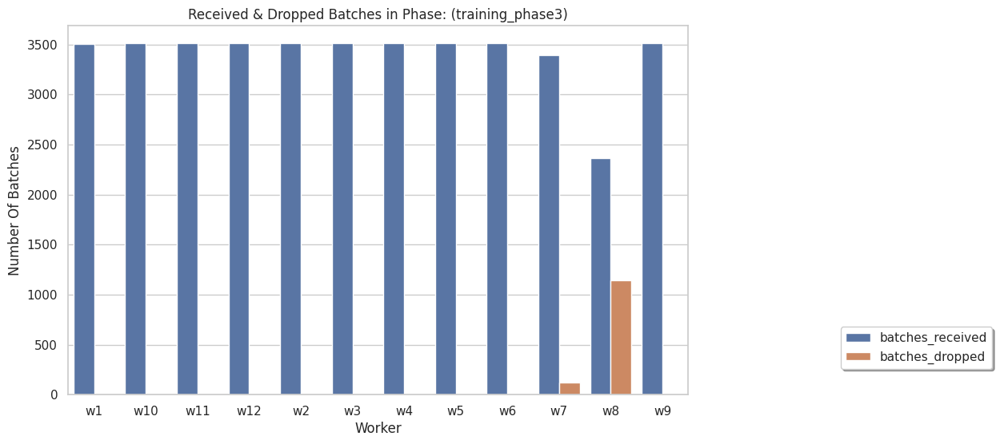

In [21]:
stats_train3.plot_batches_status(plot=True)

In [22]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 11:14:40,372] Experiment phase: training_phase4 of type training starts running...
[INFO][2024-08-13 11:14:40,373] Sending data to sources
[INFO][2024-08-13 11:15:03,971] Data is ready in sources
[INFO][2024-08-13 11:15:03,972] Phase training requested from Main Server
[INFO][2024-08-13 11:33:02,350] Processing experiment phase data
[INFO][2024-08-13 11:33:02,671] Processing experiment phase data completed
[INFO][2024-08-13 11:33:02,672] Start generating communication statistics for training_phase4 of type training
[INFO][2024-08-13 11:33:02,672] Statistics requested from Main Server
[INFO][2024-08-13 11:33:02,725] Statistics received from Main Server
[INFO][2024-08-13 11:33:02,726] Phase of training_phase4 training completed


In [23]:
stats_train4 = API.get_experiment_flow(exp_name).generate_stats()

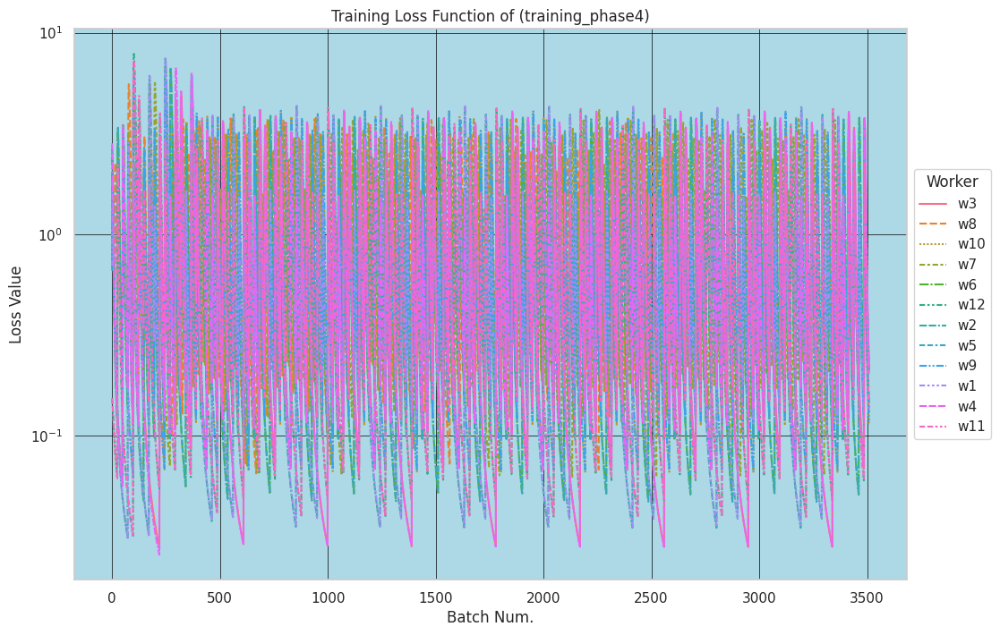

,w3,w8,w10,w7,w6,w12,w2,w5,w9,w1,w4,w11
0,0.747259,2.000877,2.767361,0.678196,2.433362,0.153502,2.673955,0.659001,0.748103,0.698420,2.825998,0.153816
1,1.751022,1.806586,2.517134,1.508387,2.186997,0.148951,2.416327,1.520963,1.725078,1.649563,2.570355,0.149256
2,1.999991,1.550477,2.173083,1.690794,1.855836,0.142610,2.063931,1.708845,1.965794,1.870841,2.217867,0.142904
3,1.903549,1.296885,1.817656,1.587123,1.524103,0.135789,1.703540,1.598673,1.870595,1.762361,1.852795,0.136069
4,1.670970,1.073278,1.492694,1.379889,1.231465,0.129084,1.378962,1.381365,1.643634,1.529063,1.518455,0.129351
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.314981,NaN,0.143560,NaN,0.182955,0.166278,0.302731,0.195042,0.152777,0.330320,0.288533,0.177092
3506,0.283902,NaN,0.134357,NaN,0.169931,0.154417,0.273891,0.180371,0.142408,0.296861,0.261796,0.163733
3507,0.257927,NaN,0.126252,NaN,0.158564,0.144109,0.249624,0.167658,0.133342,0.268953,0.239247,0.152213
3508,0.235980,NaN,0.119063,NaN,0.148565,0.135073,0.228995,0.156550,0.125352,0.245427,0.220032,0.142182


In [24]:
stats_train4.get_loss_ts(plot=True, smoothing = True, log_plot = True)

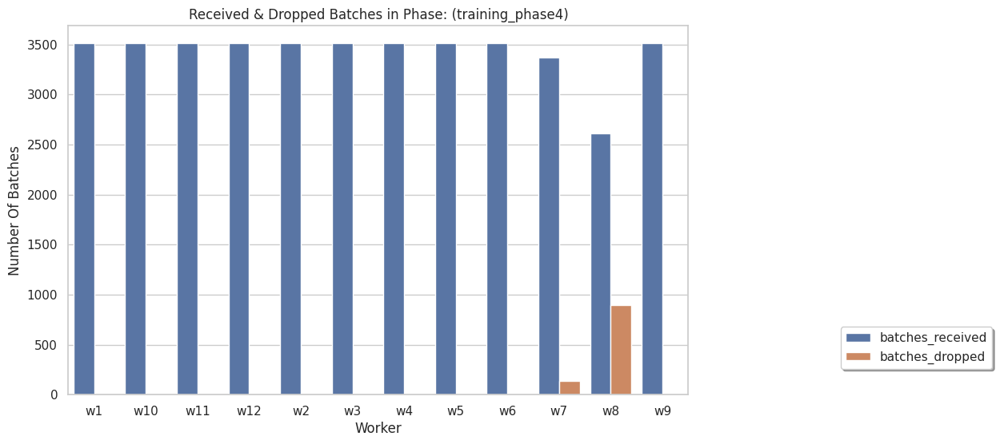

In [25]:
stats_train4.plot_batches_status(plot=True)

In [26]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 11:33:06,074] Experiment phase: training_phase5 of type training starts running...
[INFO][2024-08-13 11:33:06,075] Sending data to sources
[INFO][2024-08-13 11:33:30,659] Data is ready in sources
[INFO][2024-08-13 11:33:30,660] Phase training requested from Main Server
[INFO][2024-08-13 11:51:29,118] Processing experiment phase data
[INFO][2024-08-13 11:51:29,442] Processing experiment phase data completed
[INFO][2024-08-13 11:51:29,443] Start generating communication statistics for training_phase5 of type training
[INFO][2024-08-13 11:51:29,443] Statistics requested from Main Server
[INFO][2024-08-13 11:51:29,496] Statistics received from Main Server
[INFO][2024-08-13 11:51:29,497] Phase of training_phase5 training completed


In [27]:
stats_train5 = API.get_experiment_flow(exp_name).generate_stats()

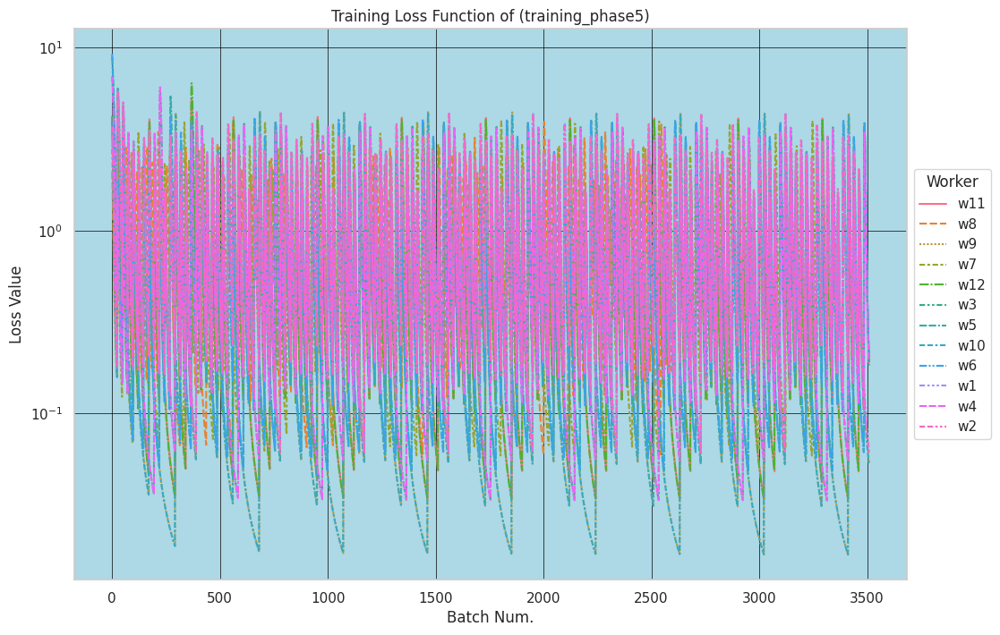

,w11,w8,w9,w7,w12,w3,w5,w10,w6,w1,w4,w2
0,4.125154,2.092718,3.933097,2.791016,4.234557,6.980585,8.936624,3.958754,9.265446,3.667925,6.958856,3.707717
1,3.606639,1.912366,3.642420,2.543347,3.943506,6.702687,8.643285,3.666527,8.464841,3.403377,6.678537,3.481242
2,3.031737,1.668542,3.224623,2.202312,3.522960,6.296587,8.212926,3.246202,7.831076,3.026634,6.268867,3.121240
3,2.548033,1.419639,2.767031,1.848988,3.058057,5.836932,7.723867,2.785482,7.284958,2.617452,5.805258,2.706214
4,2.133292,1.192862,2.318980,1.524563,2.596162,5.360585,7.214963,2.334033,6.786299,2.218934,5.325053,2.297578
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.270732,NaN,0.059324,NaN,0.269897,0.256379,0.284249,0.058045,0.284701,0.068975,0.256344,0.065650
3506,0.244860,NaN,0.057729,NaN,0.244110,0.233265,0.257468,0.056518,0.257852,0.067085,0.233217,0.063934
3507,0.223150,NaN,0.056217,NaN,0.222473,0.213707,0.234949,0.055068,0.235281,0.065294,0.213653,0.062304
3508,0.204734,NaN,0.054782,NaN,0.204119,0.196988,0.215810,0.053690,0.216099,0.063595,0.196931,0.060754


In [28]:
stats_train5.get_loss_ts(plot=True, smoothing = True, log_plot = True)

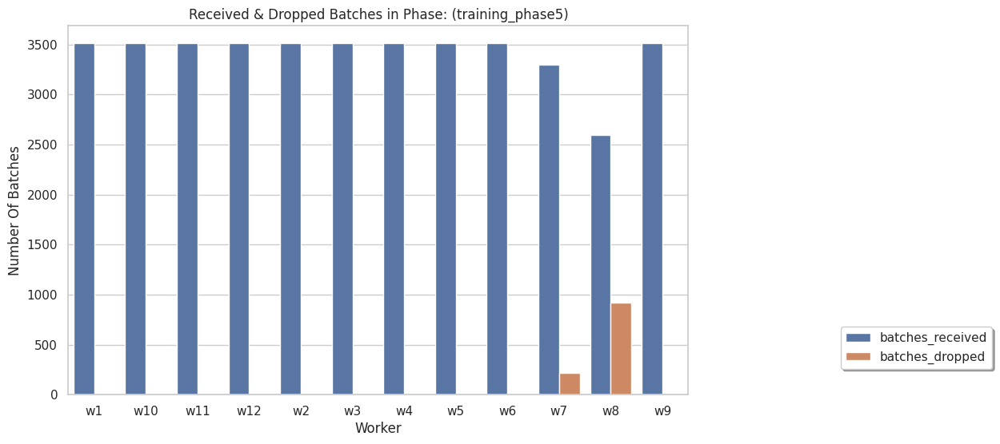

In [29]:
stats_train5.plot_batches_status(plot=True)

In [30]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 11:51:32,829] Experiment phase: training_phase6 of type training starts running...
[INFO][2024-08-13 11:51:32,830] Sending data to sources
[INFO][2024-08-13 11:51:57,319] Data is ready in sources
[INFO][2024-08-13 11:51:57,320] Phase training requested from Main Server
[INFO][2024-08-13 12:09:55,344] Processing experiment phase data
[INFO][2024-08-13 12:09:55,671] Processing experiment phase data completed
[INFO][2024-08-13 12:09:55,672] Start generating communication statistics for training_phase6 of type training
[INFO][2024-08-13 12:09:55,673] Statistics requested from Main Server
[INFO][2024-08-13 12:09:55,726] Statistics received from Main Server
[INFO][2024-08-13 12:09:55,727] Phase of training_phase6 training completed


In [31]:
stats_train6 = API.get_experiment_flow(exp_name).generate_stats()

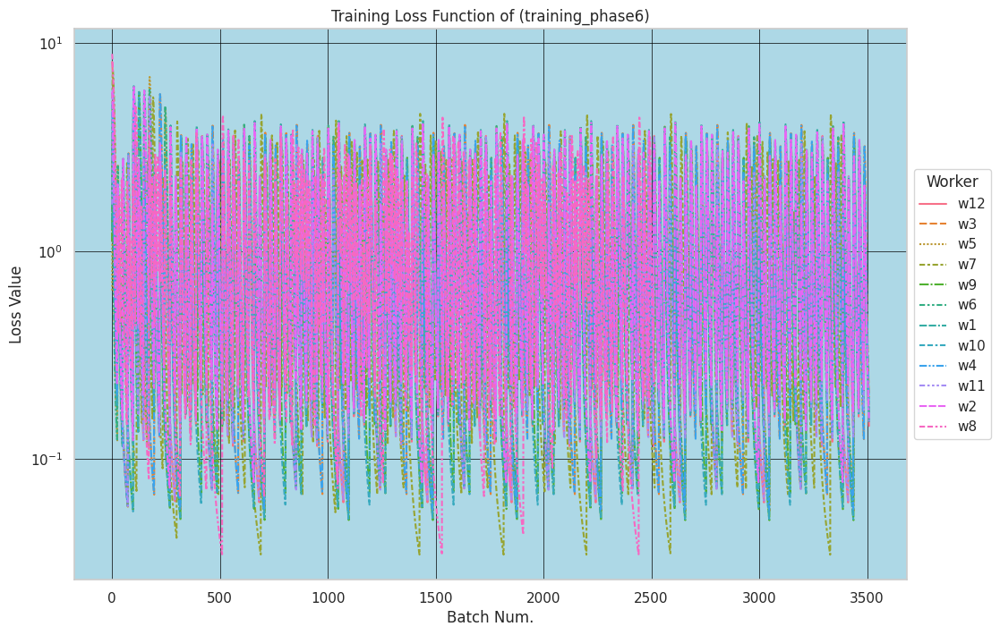

,w12,w3,w5,w7,w9,w6,w1,w10,w4,w11,w2,w8
0,8.113249,1.112788,0.646640,1.969523,1.110530,2.280539,1.269266,5.092259,4.667035,1.673248,5.854903,8.864078
1,7.828379,2.847345,1.440926,5.435351,3.037510,2.046412,3.498457,4.776338,4.385993,4.518947,5.540318,8.576365
2,7.410928,3.434096,1.606843,6.880496,3.686804,1.734872,4.300042,4.312493,3.978514,5.657061,5.077328,8.155057
3,6.936804,3.461405,1.498723,7.325573,3.708002,1.425829,4.397193,3.788770,3.524046,5.951416,4.551649,7.677215
4,6.443362,3.225763,1.294801,7.280899,3.430193,1.155269,4.154224,3.254451,3.064784,5.833797,4.009281,7.180914
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.188896,0.279911,0.206370,NaN,0.218374,0.194011,0.218887,0.204361,0.259304,0.201054,0.205738,NaN
3506,0.175479,0.254197,0.190965,NaN,0.201086,0.180291,0.202431,0.189057,0.236843,0.185980,0.191079,NaN
3507,0.163768,0.232485,0.177606,NaN,0.186197,0.168309,0.188160,0.175778,0.217717,0.172917,0.178278,NaN
3508,0.153467,0.213962,0.165925,NaN,0.173260,0.157763,0.175683,0.164161,0.201272,0.161501,0.167015,NaN


In [32]:
stats_train6.get_loss_ts(plot=True, smoothing = True, log_plot = True)

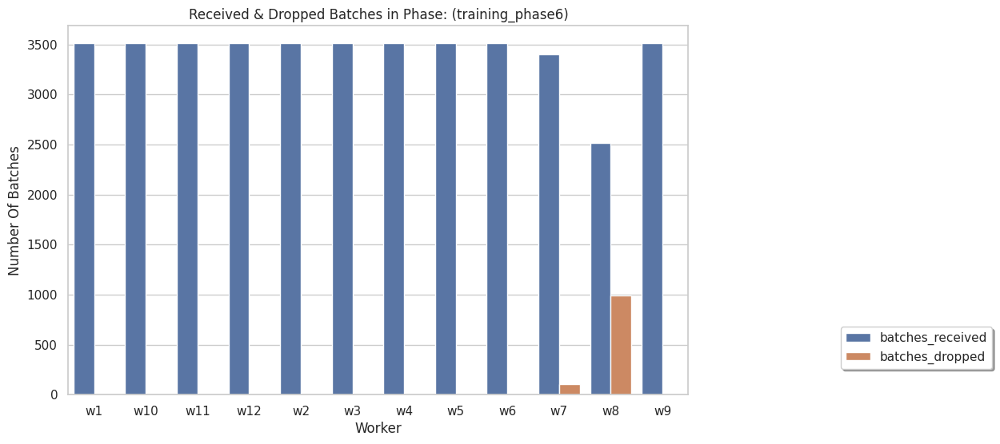

In [33]:
stats_train6.plot_batches_status(plot=True)

In [34]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 12:09:59,111] Experiment phase: training_phase7 of type training starts running...
[INFO][2024-08-13 12:09:59,113] Sending data to sources
[INFO][2024-08-13 12:10:25,368] Data is ready in sources
[INFO][2024-08-13 12:10:25,369] Phase training requested from Main Server
[INFO][2024-08-13 12:28:27,445] Processing experiment phase data
[INFO][2024-08-13 12:28:27,788] Processing experiment phase data completed
[INFO][2024-08-13 12:28:27,789] Start generating communication statistics for training_phase7 of type training
[INFO][2024-08-13 12:28:27,790] Statistics requested from Main Server
[INFO][2024-08-13 12:28:27,843] Statistics received from Main Server
[INFO][2024-08-13 12:28:27,844] Phase of training_phase7 training completed


In [35]:
stats_train7 = API.get_experiment_flow(exp_name).generate_stats()

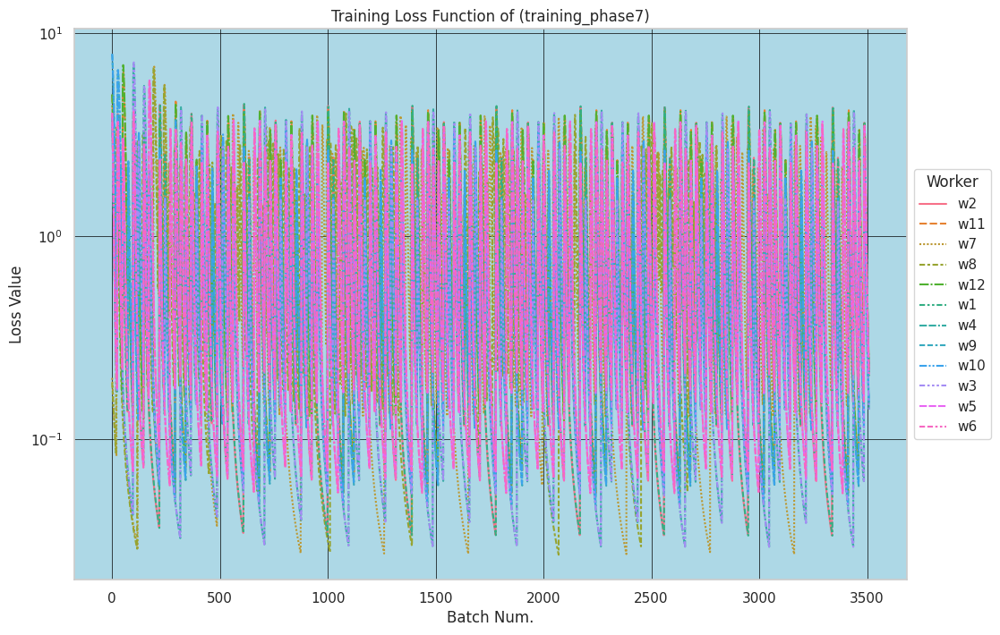

,w2,w11,w7,w8,w12,w1,w4,w9,w10,w3,w5,w6
0,3.955177,4.983263,0.200999,0.189655,5.005861,3.927954,3.713336,7.888363,7.912365,3.677150,4.038157,4.063018
1,3.674811,4.694725,0.194322,0.183642,4.715724,3.649422,3.441303,7.598845,7.621180,3.407540,3.756239,3.779372
2,3.272981,4.274987,0.185082,0.175295,4.293510,3.250479,3.053525,7.174684,7.194480,3.023538,3.351251,3.371670
3,2.833446,3.804818,0.175217,0.166350,3.820437,2.814377,2.632363,6.693435,6.710314,2.606827,2.906766,2.923959
4,2.402233,3.326956,0.165595,0.157594,3.339559,2.386760,2.222782,6.193573,6.207482,2.201879,2.468743,2.482565
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.266093,0.315361,NaN,NaN,0.315287,0.293836,0.187213,0.201262,0.201443,0.187256,0.299897,0.299895
3506,0.242764,0.285600,NaN,NaN,0.285502,0.266172,0.173020,0.185435,0.185587,0.173068,0.272164,0.272132
3507,0.222902,0.260477,NaN,NaN,0.260364,0.242850,0.160768,0.171802,0.171932,0.160817,0.248702,0.248651
3508,0.205833,0.239067,NaN,NaN,0.238945,0.222992,0.150092,0.159952,0.160066,0.150143,0.228663,0.228601


In [36]:
stats_train7.get_loss_ts(plot=True, smoothing = True, log_plot = True)

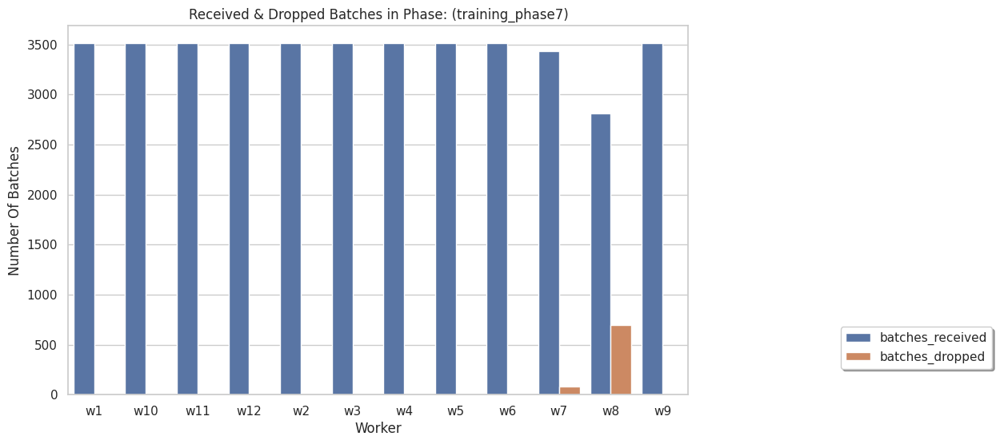

In [37]:
stats_train7.plot_batches_status(plot=True)

In [38]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 12:28:31,171] Experiment phase: training_phase8 of type training starts running...
[INFO][2024-08-13 12:28:31,172] Sending data to sources
[INFO][2024-08-13 12:28:57,396] Data is ready in sources
[INFO][2024-08-13 12:28:57,397] Phase training requested from Main Server
[INFO][2024-08-13 12:46:55,425] Processing experiment phase data
[INFO][2024-08-13 12:46:55,979] Processing experiment phase data completed
[INFO][2024-08-13 12:46:55,980] Start generating communication statistics for training_phase8 of type training
[INFO][2024-08-13 12:46:55,980] Statistics requested from Main Server
[INFO][2024-08-13 12:46:56,033] Statistics received from Main Server
[INFO][2024-08-13 12:46:56,035] Phase of training_phase8 training completed


In [39]:
stats_train8 = API.get_experiment_flow(exp_name).generate_stats()

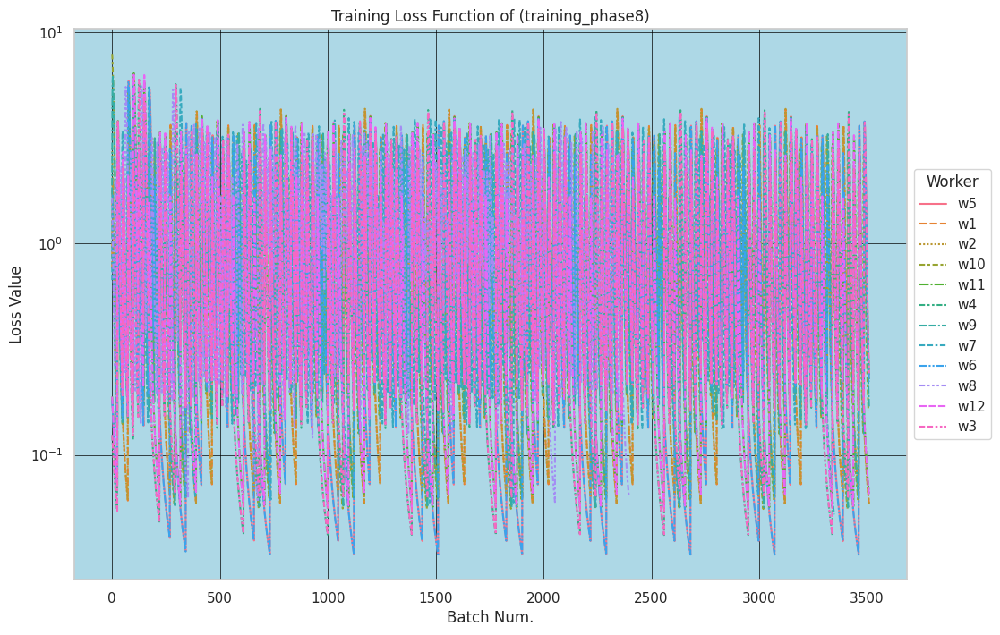

,w5,w1,w2,w10,w11,w4,w9,w7,w6,w8,w12,w3
0,0.181385,0.762697,2.847198,7.909480,0.188727,0.124114,1.702995,0.671913,0.181308,1.647072,0.188602,0.124164
1,0.175749,1.770941,2.594460,7.616643,0.182759,0.120870,4.665232,1.511816,0.175672,1.488196,0.182635,0.120919
2,0.167915,2.024704,2.245520,7.187040,0.174473,0.116318,5.853766,1.695962,0.167839,1.282020,0.174352,0.116366
3,0.159510,1.932346,1.883108,6.698877,0.165593,0.111384,6.165172,1.590445,0.159435,1.080238,0.165475,0.111432
4,0.151271,1.702284,1.549745,6.191021,0.156899,0.106496,6.047938,1.380318,0.151197,0.903414,0.156785,0.106542
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.350779,0.065506,0.065501,0.172298,0.072903,0.329338,0.233700,NaN,0.321037,NaN,0.072839,0.359765
3506,0.314320,0.063707,0.063702,0.160911,0.070800,0.297266,0.213827,NaN,0.289628,NaN,0.070738,0.322580
3507,0.283982,0.062003,0.061999,NaN,0.068813,0.270305,0.196891,NaN,0.263269,NaN,0.068752,0.291578
3508,0.258475,0.060389,0.060383,NaN,0.066933,0.247421,0.182316,NaN,0.240925,NaN,0.066874,0.265472


In [40]:
stats_train8.get_loss_ts(plot=True, smoothing = True, log_plot = True)

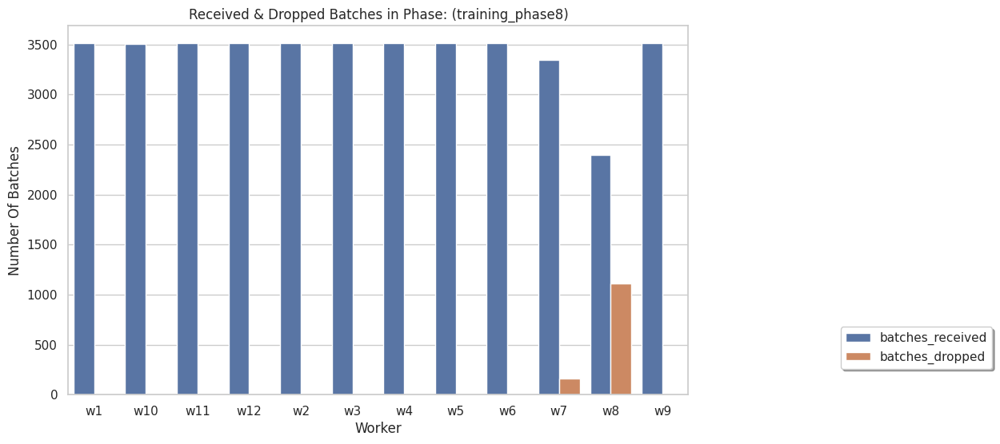

In [41]:
stats_train8.plot_batches_status(plot=True)

In [42]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 12:46:59,402] Experiment phase: prediction_phase1 of type prediction starts running...
[INFO][2024-08-13 12:46:59,403] Sending data to sources
[INFO][2024-08-13 12:47:23,175] Data is ready in sources
[INFO][2024-08-13 12:47:23,176] Phase prediction requested from Main Server
[INFO][2024-08-13 12:49:25,566] Processing experiment phase data
[INFO][2024-08-13 12:49:25,624] Processing experiment phase data completed
[INFO][2024-08-13 12:49:25,625] Start generating communication statistics for prediction_phase1 of type prediction
[INFO][2024-08-13 12:49:25,626] Statistics requested from Main Server
[INFO][2024-08-13 12:49:25,679] Statistics received from Main Server
[INFO][2024-08-13 12:49:25,680] Phase of prediction_phase1 prediction completed


In [43]:
stats_pred1 = API.get_experiment_flow(exp_name).generate_stats()

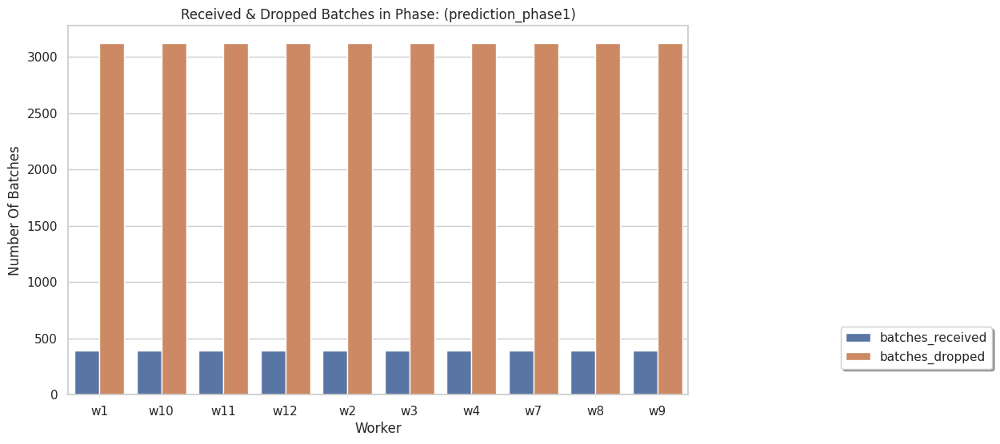

In [44]:
stats_pred1.plot_batches_status(plot=True)

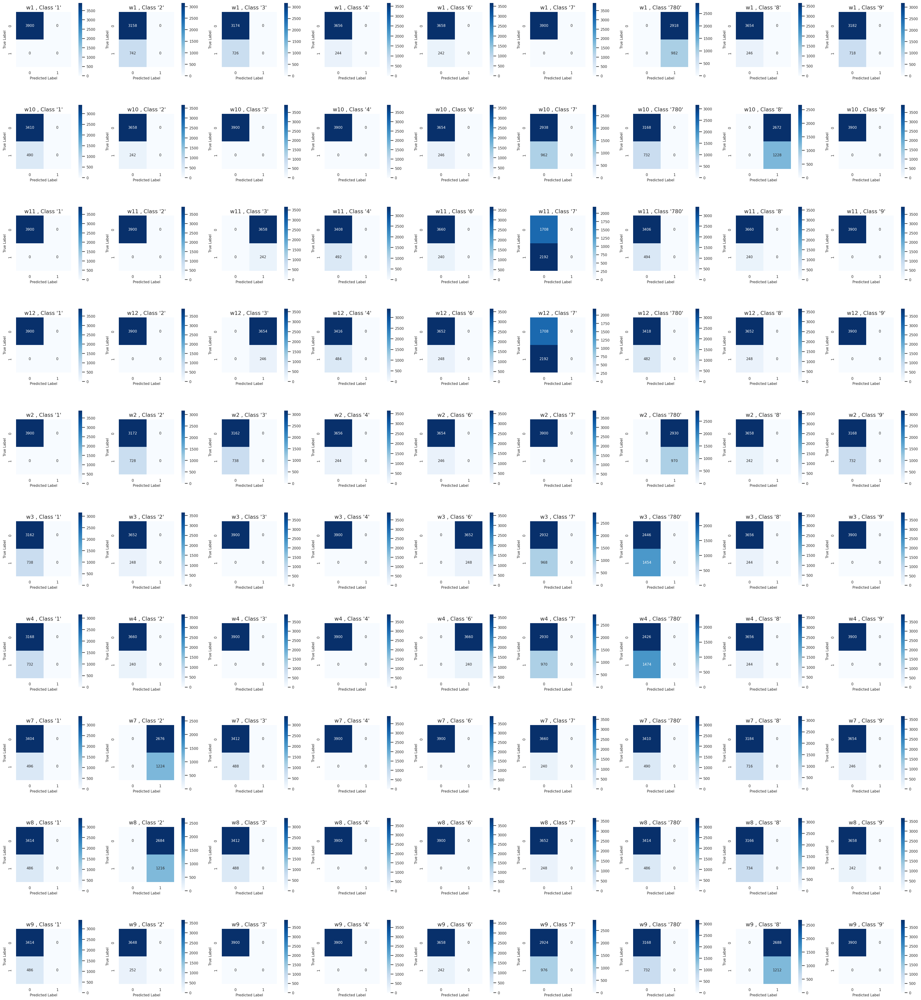

In [45]:
_ , conf_mats1 = stats_pred1.get_confusion_matrices(plot=True)

In [46]:
stats_pred1.get_model_performence_stats(conf_mats1 , show = True)

,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w1,1,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
1,w1,2,3158,0,742,0,0.809744,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
2,w1,3,3174,0,726,0,0.813846,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
3,w1,4,3656,0,244,0,0.937436,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
4,w1,780,0,2918,0,982,0.251795,0.500000,0.251795,1.000000,0.000000,0.000000,0.402294
5,w1,6,3658,0,242,0,0.937949,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
6,w1,7,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
7,w1,8,3654,0,246,0,0.936923,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
8,w1,9,3182,0,718,0,0.815897,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
9,w2,1,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000


,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w1,1,3900,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
1,w1,2,3158,0,742,0,0.809744,0.5,0.000000,0.0,1.0,0.0,0.000000
2,w1,3,3174,0,726,0,0.813846,0.5,0.000000,0.0,1.0,0.0,0.000000
3,w1,4,3656,0,244,0,0.937436,0.5,0.000000,0.0,1.0,0.0,0.000000
4,w1,780,0,2918,0,982,0.251795,0.5,0.251795,1.0,0.0,0.0,0.402294
...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,w12,780,3418,0,482,0,0.876410,0.5,0.000000,0.0,1.0,0.0,0.000000
86,w12,6,3652,0,248,0,0.936410,0.5,0.000000,0.0,1.0,0.0,0.000000
87,w12,7,1708,0,2192,0,0.437949,0.5,0.000000,0.0,1.0,0.0,0.000000
88,w12,8,3652,0,248,0,0.936410,0.5,0.000000,0.0,1.0,0.0,0.000000


In [47]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-13 12:53:43,094] Experiment phase: prediction_phase2 of type prediction starts running...
[INFO][2024-08-13 12:53:43,095] Sending data to sources
[INFO][2024-08-13 12:54:09,223] Data is ready in sources
[INFO][2024-08-13 12:54:09,224] Phase prediction requested from Main Server
[INFO][2024-08-13 12:56:11,886] Processing experiment phase data
[INFO][2024-08-13 12:56:11,947] Processing experiment phase data completed
[INFO][2024-08-13 12:56:11,948] Start generating communication statistics for prediction_phase2 of type prediction
[INFO][2024-08-13 12:56:11,948] Statistics requested from Main Server
[INFO][2024-08-13 12:56:12,001] Statistics received from Main Server
[INFO][2024-08-13 12:56:12,002] Phase of prediction_phase2 prediction completed


In [48]:
stats_pred2 = API.get_experiment_flow(exp_name).generate_stats()

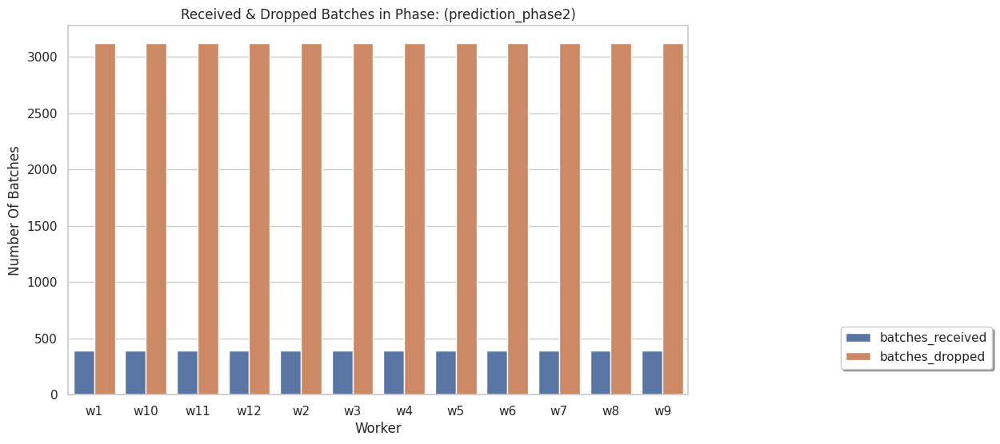

In [49]:
stats_pred2.plot_batches_status(plot=True)

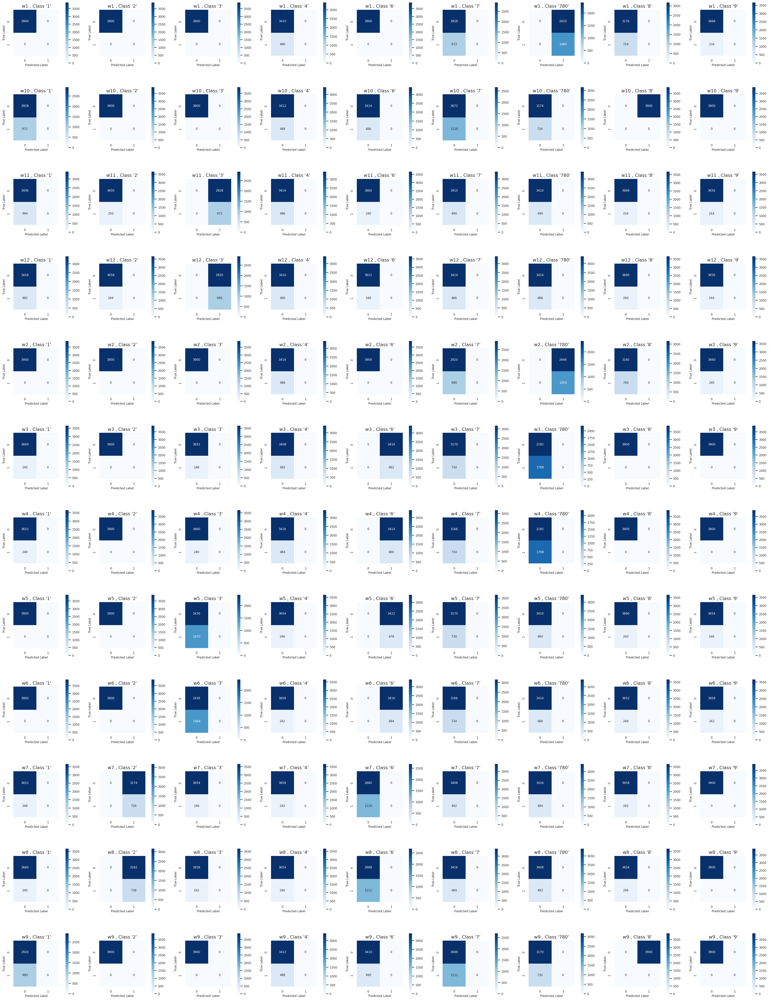

In [50]:
_ , conf_mats2 = stats_pred2.get_confusion_matrices(plot=True)

In [51]:
stats_pred2.get_model_performence_stats(conf_mats2 , show = True)

,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w2,1,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
1,w2,2,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
2,w2,3,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
3,w2,4,3414,0,486,0,0.875385,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
4,w2,780,0,2446,0,1454,0.372821,0.500000,0.372821,1.000000,0.000000,0.000000,0.543145
5,w2,6,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
6,w2,7,2920,0,980,0,0.748718,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
7,w2,8,3160,0,740,0,0.810256,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
8,w2,9,3660,0,240,0,0.938462,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000
9,w1,1,3900,0,0,0,1.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000


,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w2,1,3900,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
1,w2,2,3900,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
2,w2,3,3900,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
3,w2,4,3414,0,486,0,0.875385,0.5,0.000000,0.0,1.0,0.0,0.000000
4,w2,780,0,2446,0,1454,0.372821,0.5,0.372821,1.0,0.0,0.0,0.543145
...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,w11,780,3410,0,490,0,0.874359,0.5,0.000000,0.0,1.0,0.0,0.000000
104,w11,6,3660,0,240,0,0.938462,0.5,0.000000,0.0,1.0,0.0,0.000000
105,w11,7,3410,0,490,0,0.874359,0.5,0.000000,0.0,1.0,0.0,0.000000
106,w11,8,3666,0,234,0,0.940000,0.5,0.000000,0.0,1.0,0.0,0.000000
